In [1]:
# import spacy
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import TruncatedSVD, PCA
from sklearn.manifold import MDS
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity, euclidean_distances
from sklearn.feature_selection import chi2
import os, sys
import glob
import gensim
from gensim.corpora import Dictionary
from gensim.similarities import MatrixSimilarity
from gensim.models import ldamodel, doc2vec, LsiModel, LdaModel, CoherenceModel
from gensim.matutils import kullback_leibler, jaccard, hellinger, sparse2full
import nltk
# nltk.download('punkt')
import string
import csv
import math
import statistics
import datetime
from nltk.corpus import stopwords
from nltk.util import ngrams
# nltk.download('stopwords')
from collections import OrderedDict, Counter, namedtuple
import random
import codecs, difflib, distance
import rpy2
# from datasketch import MinHash
import networkx as nx
import matplotlib.pyplot as plt
from networkx.readwrite import json_graph
from bokeh.plotting import figure, show, output_file
from bokeh.models import HoverTool, ColumnDataSource
from bokeh.layouts import row, column
from progress.bar import IncrementalBar
import warnings
warnings.filterwarnings('ignore')
# nlp = spacy.load('en_core_web_lg')
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
# %load_ext rpy2.ipython

In [4]:
df = pd.read_csv('../scripts/final_corpus_lda_words.csv')
df.sort_values(by=['doc_page', 'topic_id', 'topic_weight', 'word_weight'], ascending=[True, True, False, False], inplace=True)

In [5]:
def join_words(rows):
    words = []
    for r in rows:
        words.append(r)
    return words
    
df_topic_words = df.groupby(['doc_page', 'topic_id'])['word'].apply(join_words).reset_index()

def join_top_words(rows):
    words = []
    r = rows[0:5]
    for x in r:
        words.append(x)
    
    return '_'.join(words)
    
df_top_words = df.groupby(['doc_page', 'topic_id'])['word'].apply(join_top_words).reset_index()

In [6]:
df_top_words.rename(columns={'word': 'top_word'}, inplace=True)
df_words = pd.merge(df_top_words, df_topic_words, on=['doc_page', 'topic_id'])

In [7]:

pi = pd.pivot_table(df, values='topic_weight', index=['doc_page'], columns=['topic_id'], fill_value=0)

In [8]:
dtm = pi.div(pi.sum(axis=1), axis=0)

# Shift back to a long dataframe
dt_norm = dtm.stack().reset_index()
dt_norm.columns = ['doc_page', 'topic_id', 'topic_weight']

In [9]:
import altair as alt
import glob, os
import warnings
warnings.filterwarnings('ignore')

alt.renderers.enable('notebook')
alt.data_transformers.enable('default', max_rows=None)
# alt.Chart(dt_norm).mark_line().encode(
#     x='doc_page:N',
#     y='topic_weight',
#     color='topic_id:N'
# )

DataTransformerRegistry.enable('default')

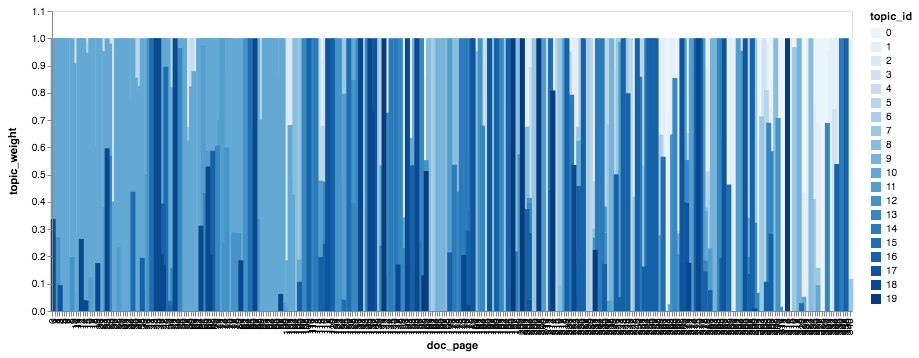

In [24]:

alt.Chart(t).mark_bar(size=5).encode(
    x='doc_page:N',
    y=alt.Y('topic_weight'),
    color=alt.Color('topic_id:N', scale=alt.Scale(scheme='blues')),
    tooltip=['top_word', 'topic_id', 'topic_weight', 'date'],
#     row=alt.Row('topic_id:N')
).properties(
    height=300,
    width=800
)

In [10]:
df_1 = pd.read_csv('../scripts/combined_pages_date_binned.csv')


In [11]:
df_1.rename(columns={'Unnamed: 0': 'doc_page'}, inplace=True)


In [12]:
df_topics = pd.merge(dt_norm, df_words, on=['doc_page', 'topic_id'])


In [13]:
# all_df = pd.merge(df, df_1, on=['doc_page'])
all_df = pd.merge(df_topics, df_1, how='left', on='doc_page')
all_df

,doc_page,topic_id,topic_weight,top_word,word,date,binned,token_lists,token_texts,page_number,page_str,tokenized_counts
0,0.0,10.0,0.662049,eichmann_liras_cuban_pa-_indepen-,"[eichmann, liras, cuban, pa-, indepen-, khedda...",1960-August-14,0,"[['weekly', 'middle', 'east', 'news', 'magazin...",['weekly middle east news magazine ja arab obs...,35,0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18...,13342
1,0.0,18.0,0.337951,oas_kibutz_hammarskjoeld_cantars_separatist,"[oas, kibutz, hammarskjoeld, cantars, separati...",1960-August-14,0,"[['weekly', 'middle', 'east', 'news', 'magazin...",['weekly middle east news magazine ja arab obs...,35,0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18...,13342
2,1.0,10.0,1.000000,eichmann_liras_cuban_pa-_indepen-,"[eichmann, liras, cuban, pa-, indepen-, khedda...",1960-August-7,0,"[['sep', 'v', 'blaustein', 'library', 'middle'...","[""sep v blaustein library middle east news azi...",36,0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18...,12903
3,2.0,10.0,0.729652,eichmann_liras_cuban_pa-_indepen-,"[eichmann, liras, cuban, pa-, indepen-, khedda...",1960-December-25,0,"[['blausteipskibrary', 'mry', '10s', 't.', 'l....",['blausteipskibrary mry 10s t. l. mj `` weekly...,36,0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18...,13162
4,2.0,12.0,0.270348,dayan_oas_histadrut_ecm_bairam,"[dayan, oas, histadrut, ecm, bairam, pilgrimag...",1960-December-25,0,"[['blausteipskibrary', 'mry', '10s', 't.', 'l....",['blausteipskibrary mry 10s t. l. mj `` weekly...,36,0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18...,13162
5,3.0,10.0,0.905293,eichmann_liras_cuban_pa-_indepen-,"[eichmann, liras, cuban, pa-, indepen-, khedda...",1960-December-4,0,"[['vi', '0004f', 'rab', 'observer', 'see', 'pa...",['vi 0004f rab observer see page december afri...,33,0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 19 20...,11749
6,3.0,17.0,0.094707,christmas_sallal_karim_tug_jesus,"[christmas, sallal, karim, tug, jesus, duke, o...",1960-December-4,0,"[['vi', '0004f', 'rab', 'observer', 'see', 'pa...",['vi 0004f rab observer see page december afri...,33,0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 19 20...,11749
7,4.0,10.0,1.000000,eichmann_liras_cuban_pa-_indepen-,"[eichmann, liras, cuban, pa-, indepen-, khedda...",1960-July-10,0,"[['al-kahira', 'bank', 's.a.e', 'head', 'offic...","['', '', '', ""al-kahira bank s.a.e head office...",36,0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18...,12707
8,5.0,10.0,1.000000,eichmann_liras_cuban_pa-_indepen-,"[eichmann, liras, cuban, pa-, indepen-, khedda...",1960-July-17,0,"[['bitken', 'weekly', 'middle', 'east', 'news'...","[""bitken weekly middle east news magazine arab...",36,0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18...,12706
9,6.0,10.0,1.000000,eichmann_liras_cuban_pa-_indepen-,"[eichmann, liras, cuban, pa-, indepen-, khedda...",1960-July-3,0,"[['blausein', 'library', 'weekly', 'middle', '...",['blausein library weekly middle east news mag...,36,0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18...,10529


In [23]:
t = all_df.drop(['token_texts', 'token_lists'], axis=1)
t['datetime'] = pd.to_datetime(t['date'], format='%Y-%B-%d', errors='coerce')
t.sort_values(by=['topic_id'], inplace=True)
t.top_word.unique()

array(['★_asu_vietnamese_bahrain_plo',
       'vietnamese_feisal_heikal_negroes_oau', 'و_في_،_من_ا',
       'sukarno_liras_effendi_makarios_toure',
       'edfu_suicide_toynbee_shawki_sugar-cane',
       '‘_cancer_welsh_rihani_toynbee', 'stamps_stamp_postal_‘_faisal',
       'olympic_ramadan_pavilion_bandaranaike_gravity',
       'hammer_adenauer_nubians_cu.m_muslims',
       'honey_gandhi_o.m.t_muslims_indira',
       'eichmann_liras_cuban_pa-_indepen-',
       'gagarin_oas_beer_bellivier_kantars',
       'dayan_oas_histadrut_ecm_bairam',
       'oas_kibbutz_mouton_khaled_nkomo', 'hammer_bey_‘_sq_dresden',
       'negroes_basutoland_oas_hamlin_lincoln',
       'toynbee_★_olympic_nu_p.o.b', 'christmas_sallal_karim_tug_jesus',
       'oas_kibutz_hammarskjoeld_cantars_separatist',
       'borneo_fatma_drug_‘_★'], dtype=object)

In [114]:
len(t.date.unique())

110

In [193]:
first = t.groupby('top_word').first().reset_index()
first.sort_values(by=['topic_id'], inplace=True)
first.topic_weight = first.topic_weight.round(2)
first = first[['word', 'top_word', 'topic_id']]
first.to_csv('congo_topics_words.csv', sep=' ', index=False, header=False)

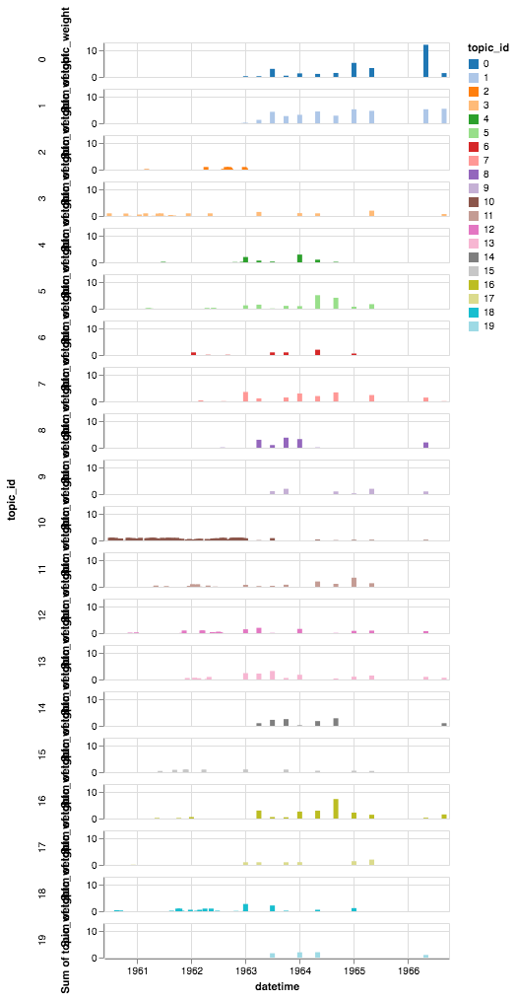

In [15]:
alt.Chart(t).mark_bar().encode(
    x='datetime:T',
    y=alt.Y('sum(topic_weight)'),
    color=alt.Color('topic_id:N', scale=alt.Scale(scheme='category20')),
    row=alt.Row('topic_id:N')
).properties(
    height=35,
    width=350
)

In [81]:
all_df.date.unique()

array(['1960-August-14', '1960-August-7', '1960-December-25',
       '1960-December-4', '1960-July-10', '1960-July-17', '1960-July-3',
       '1960-June-26', '1960-November-13', '1960-November-6',
       '1960-October-16', '1960-October-30', '1960-September-11',
       '1961-April-16', '1961-April-2', '1961-April-23', '1961-April-30',
       '1961-April-9', '1961-August-13', '1961-August-20',
       '1961-August-27', '1961-December-11', '1961-December-18',
       '1961-December-25', '1961-February-26', '1961-January-15',
       '1961-January-22', '1961-July-16', '1961-July-23', '1961-July-30',
       '1961-June-11', '1961-June-18', '1961-June-25', '1961-June-4',
       '1961-March-12', '1961-March-19', '1961-March-5', '1961-May-14',
       '1961-May-21', '1961-May-7', '1961-November-13',
       '1961-November-20', '1961-November-27', '1961-October-1',
       '1961-October-15', '1961-October-29', '1961-October-8',
       '1961-September-10', '1961-September-24', '1961-September-3',
    

In [87]:
years = pd.read_csv('../data/combined_all_data_ner_congo.csv')
years.date.unique()

array(['1960-August-14', '1960-August-7', '1960-December-25',
       '1960-December-4', '1960-July-10', '1960-July-17', '1960-July-3',
       '1960-June-26', '1960-November-13', '1960-November-6',
       '1960-October-16', '1960-October-30', '1960-September-11',
       '1961-April-16', '1961-April-23', '1961-April-2', '1961-April-30',
       '1961-April-9', '1961-August-13', '1961-August-20',
       '1961-August-27', '1961-December-11', '1961-December-18',
       '1961-December-25', '1961-February-26', '1961-January-15',
       '1961-January-22', '1961-July-16', '1961-July-23', '1961-July-30',
       '1961-June-11', '1961-June-18', '1961-June-25', '1961-June-4',
       '1961-March-12', '1961-March-19', '1961-March-5', '1961-May-14',
       '1961-May-21', '1961-May-7', '1961-November-13',
       '1961-November-20', '1961-November-27', '1961-October-15',
       '1961-October-1', '1961-October-29', '1961-October-8',
       '1961-September-10', '1961-September-24', '1961-September-3',
    

In [213]:
df_sim = pd.read_csv('../scripts/all_issue_similarity_congo_terms_dates_binned_fixed.csv')
df_sim.columns
df_sim.drop(['date_run'], axis=1, inplace=True)

In [214]:

df_sim['avg'] = df_sim[['countsvec_cos', 'tfidfvec_cos','jaccard_sim', 'lsi_cos']].mean(axis=1)
# df_3 = df_sim_grouped
df_sim = df_sim.loc[(df_sim.first_issue_date == df_sim.second_issue_date) == False]

In [215]:
df_sim

,first_issue_date,first_page_number,second_issue_date,second_page_number,countsvec_cos,tfidfvec_cos,jaccard_sim,lsi_cos,avg
0,1960-June-26,20 21,1960-July-3,9 20 22,0.219974,0.025681,0.110136,0.460515,0.204076
1,1960-June-26,20 21,1960-July-10,10 11 19 30,0.228413,0.031298,0.137383,0.484769,0.220466
2,1960-June-26,20 21,1960-July-17,0 2 3 9 10 13 20 22 32,0.197276,0.029170,0.123919,0.383735,0.183525
3,1960-June-26,20 21,1960-August-7,2 15 16 19 20 21 22 23 31 32,0.237905,0.033485,0.136494,0.447062,0.213737
4,1960-June-26,20 21,1960-August-14,2 13 14 15 16 18 19 20 26 29 30 31 32 33,0.218226,0.031242,0.122702,0.392059,0.191057
5,1960-June-26,20 21,1960-September-11,2 11 12 13 14 15 16 20 21 22 27 33,0.242498,0.033654,0.126630,0.445219,0.212000
6,1960-June-26,20 21,1960-October-16,12 17 20 28,0.206542,0.030723,0.139732,0.423281,0.200069
7,1960-June-26,20 21,1960-October-30,33,0.088152,0.020463,0.092222,0.220562,0.105350
8,1960-June-26,20 21,1960-November-6,14 15 16 17 19 33,0.138441,0.026766,0.121646,0.286149,0.143250
9,1960-June-26,20 21,1960-November-13,7 8 17 18 19 26 33,0.135011,0.026698,0.117701,0.283059,0.140617


In [222]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

from itertools import combinations 
# sim = df_sim.loc[(df_sim.topic_1 == df_sim.topic_2) == False]
# sim.sort_values(by=['topic_1'])

# kl = sim.drop(['hellinger'], axis=1)
# sim.kullback_leibler = sim.kullback_leibler.round(2)
# sim.hellinger = sim.hellinger.round(2)
# sim['avg'] = sim[['hellinger', 'kullback_leibler']].mean(axis=1)
sim = df_sim
sim.avg = sim.avg.round(2)
# sim['date2'] = sim['second_issue_date'].astype(str)
# sim['date1'] = sim['first_issue_date'].astype(str)
# sim.avg = sim.avg.astype(float)
sim['date2'] = pd.to_datetime(sim['second_issue_date'], format='%Y-%B-%d', errors='coerce')
sim['date1'] = pd.to_datetime(sim['first_issue_date'], format='%Y-%B-%d', errors='coerce')
# sim['top_1'] = 'top' + sim.topic_1.astype(str)
# sum_combos.year = sum_combos.year.astype(int)
# pi = pd.pivot_table(sim, values='avg', index=['date1'], columns=['date2'], fill_value=0).reset_index()

# pi = pd.DataFrame(sim['avg'], index=sim['date1'], columns=sim['date2'])
# pi.fillna(value=np.nan, inplace=True)
# pi.sortlevel(level=0, ascending=True, inplace=True)
# pi.sort_values(by=['topic_1'], inplace=True)
# pi.sort_index(axis=1, inplace=True)
# pi.reset_index()
# pi.set_index('date1')
# pi.drop(['index'], axis=1, inplace=True)
# plt.figure()
# plt.pcolor(pi)
# plt.yticks(np.arange(0.5, len(pi.index), 1), pi.index)
# plt.xticks(np.arange(0.5, len(pi.columns), 1), pi.columns)
# # # plt.figure(figsize=(20, 26))
# ax = plt.axes()
# g = sns.heatmap(pi)
# # ax.set_title('Topic similarities for Congo keywords', fontsize=16)
# # # ax.xaxis.tick_top()
# # # # # # # # axes = g.axes.flatten()
# # # # # # # # axes[0].set_title('Correlation between Congo Crisis Keywords and Corpus Distributions over Time')
# # ax.set_ylabel('')
# # ax.set_xlabel('')
# # # # ax.tick_params(labelsize=14)

# # # plt.savefig('congo_topic_similarity.png')
# plt.show()
# pi = pi[pi.columns].astype(float)
# pi = sim[['date1', 'date2', 'avg']]
pi = pd.melt(sim, id_vars=['first_issue_date', 'first_page_number', 'second_issue_date',
       'second_page_number','date2', 'date1'], value_name='value')
pi

,first_issue_date,first_page_number,second_issue_date,second_page_number,date2,date1,variable,value
0,1960-June-26,20 21,1960-July-3,9 20 22,1960-07-03,1960-06-26,countsvec_cos,0.219974
1,1960-June-26,20 21,1960-July-10,10 11 19 30,1960-07-10,1960-06-26,countsvec_cos,0.228413
2,1960-June-26,20 21,1960-July-17,0 2 3 9 10 13 20 22 32,1960-07-17,1960-06-26,countsvec_cos,0.197276
3,1960-June-26,20 21,1960-August-7,2 15 16 19 20 21 22 23 31 32,1960-08-07,1960-06-26,countsvec_cos,0.237905
4,1960-June-26,20 21,1960-August-14,2 13 14 15 16 18 19 20 26 29 30 31 32 33,1960-08-14,1960-06-26,countsvec_cos,0.218226
5,1960-June-26,20 21,1960-September-11,2 11 12 13 14 15 16 20 21 22 27 33,1960-09-11,1960-06-26,countsvec_cos,0.242498
6,1960-June-26,20 21,1960-October-16,12 17 20 28,1960-10-16,1960-06-26,countsvec_cos,0.206542
7,1960-June-26,20 21,1960-October-30,33,1960-10-30,1960-06-26,countsvec_cos,0.088152
8,1960-June-26,20 21,1960-November-6,14 15 16 17 19 33,1960-11-06,1960-06-26,countsvec_cos,0.138441
9,1960-June-26,20 21,1960-November-13,7 8 17 18 19 26 33,1960-11-13,1960-06-26,countsvec_cos,0.135011


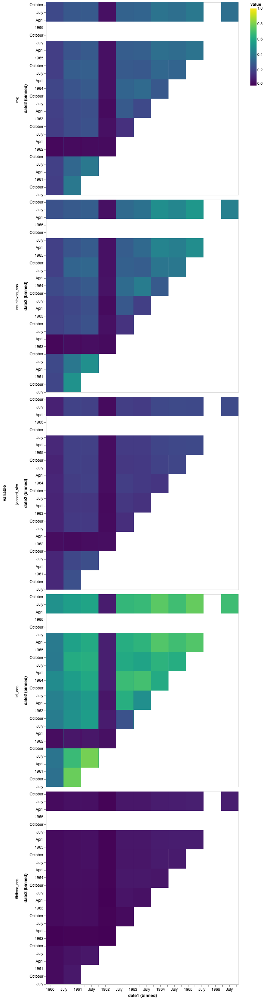

In [224]:

pts = alt.selection(type="single", encodings=['x'])
rect = alt.Chart(pi).mark_rect().encode(
    x=alt.X('date1:T', bin=True),
    y=alt.Y('date2:T', bin=True),
    color='value:Q',
    row=alt.Row('variable:N')
).properties(
    width=500,
    height=500
)
rect
# bar = alt.Chart(pi).mark_bar().encode(
#     x=alt.X('avg', bin=True),
#     y='count()',
#     color=alt.condition(pts, alt.ColorValue("steelblue"), alt.ColorValue("grey"))
# ).properties(
#     selection=pts
# )
# alt.vconcat(
#     rect,
#     bar
# ).resolve_legend(
#     color="independent",
#     size="independent"
# )

In [219]:
pi.sort_values(by=['avg'])

,date1,date2,avg
5155,1962-05-28,1962-11-05,0.00
5114,1962-05-21,1962-11-05,0.01
5650,1962-09-17,1962-11-05,0.01
5345,1962-07-02,1962-11-05,0.01
2972,1961-07-16,1962-11-05,0.01
4700,1962-02-26,1962-11-05,0.01
4379,1962-01-15,1962-11-05,0.01
1124,1960-11-13,1962-11-05,0.01
5234,1962-06-11,1962-11-05,0.02
4847,1962-03-19,1962-11-05,0.02


In [159]:
test = pi

In [160]:
test.columns

Index(['date1', 'date2', 'avg'], dtype='object')

In [161]:
test['dates'] = test.date1.astype(str) + '_' + test.date2.astype(str)

In [166]:
df_1 = pd.read_csv('../scripts/combined_pages_date_congo_text_ner_binned.csv')
from ast import literal_eval
import itertools
df = df_1

# def get_texts(rows):
    
#     x = literal_eval(rows.values[0])
#     t = ' '.join(x)
# #     model_texts.append(t)
#     return t

# df_grouped = df.groupby(['date', 'binned', 'page_str'])['token_texts'].apply(get_texts).reset_index()


# def get_lists(rows):

#     x = literal_eval(rows.values[0])
# #     print(len(x))
#     combined = list(itertools.chain.from_iterable(x))

#     return combined

# df_grouped1 = df.groupby(['date', 'binned', 'page_str'])['token_lists'].apply(get_lists).reset_index()
# df_all = pd.merge(df_grouped, df_grouped1, on=['date', 'binned', 'page_str'])
# df_all['datetime'] = pd.to_datetime(df_all['date'], format='%Y-%B-%d', errors='coerce')
# df_all.sort_values(by=['datetime'], inplace=True)
# df = df_all
dates = df.date.unique()
t = list(combinations(dates, 2))
t
for item in t:
    print(item[0], item[1])
# for index, date in enumerate(dates):
#     if index+1 < len(dates):
#         for d in dates:

1960-August-14 1960-August-7
1960-August-14 1960-December-25
1960-August-14 1960-December-4
1960-August-14 1960-July-10
1960-August-14 1960-July-17
1960-August-14 1960-July-3
1960-August-14 1960-June-26
1960-August-14 1960-November-13
1960-August-14 1960-November-6
1960-August-14 1960-October-16
1960-August-14 1960-October-30
1960-August-14 1960-September-11
1960-August-14 1961-April-16
1960-August-14 1961-April-2
1960-August-14 1961-April-23
1960-August-14 1961-April-30
1960-August-14 1961-April-9
1960-August-14 1961-August-13
1960-August-14 1961-August-20
1960-August-14 1961-August-27
1960-August-14 1961-December-11
1960-August-14 1961-December-18
1960-August-14 1961-December-25
1960-August-14 1961-February-26
1960-August-14 1961-January-15
1960-August-14 1961-January-22
1960-August-14 1961-July-16
1960-August-14 1961-July-23
1960-August-14 1961-July-30
1960-August-14 1961-June-11
1960-August-14 1961-June-18
1960-August-14 1961-June-25
1960-August-14 1961-June-4
1960-August-14 1961-M

1960-June-26 1962-March-19
1960-June-26 1962-March-26
1960-June-26 1962-March-5
1960-June-26 1962-May-14
1960-June-26 1962-May-21
1960-June-26 1962-May-28
1960-June-26 1962-November-12
1960-June-26 1962-November-19
1960-June-26 1962-November-26
1960-June-26 1962-November-5
1960-June-26 1962-October-1
1960-June-26 1962-October-16
1960-June-26 1962-October-22
1960-June-26 1962-October-29
1960-June-26 1962-October-8
1960-June-26 1962-September-10
1960-June-26 1962-September-17
1960-June-26 1962-September-24
1960-June-26 1962-September-3
1960-June-26 1963-April-01
1960-June-26 1963-January-01
1960-June-26 1963-July-01
1960-June-26 1963-October-01
1960-June-26 1964-January-01
1960-June-26 1964-May-01
1960-June-26 1964-September-01
1960-June-26 1965-January-01
1960-June-26 1965-May-01
1960-June-26 1966-May-01
1960-June-26 1966-September-01
1960-November-13 1960-November-6
1960-November-13 1960-October-16
1960-November-13 1960-October-30
1960-November-13 1960-September-11
1960-November-13 196

1960-September-11 1962-May-21
1960-September-11 1962-May-28
1960-September-11 1962-November-12
1960-September-11 1962-November-19
1960-September-11 1962-November-26
1960-September-11 1962-November-5
1960-September-11 1962-October-1
1960-September-11 1962-October-16
1960-September-11 1962-October-22
1960-September-11 1962-October-29
1960-September-11 1962-October-8
1960-September-11 1962-September-10
1960-September-11 1962-September-17
1960-September-11 1962-September-24
1960-September-11 1962-September-3
1960-September-11 1963-April-01
1960-September-11 1963-January-01
1960-September-11 1963-July-01
1960-September-11 1963-October-01
1960-September-11 1964-January-01
1960-September-11 1964-May-01
1960-September-11 1964-September-01
1960-September-11 1965-January-01
1960-September-11 1965-May-01
1960-September-11 1966-May-01
1960-September-11 1966-September-01
1961-April-16 1961-April-2
1961-April-16 1961-April-23
1961-April-16 1961-April-30
1961-April-16 1961-April-9
1961-April-16 1961-

1961-August-13 1961-December-25
1961-August-13 1961-February-26
1961-August-13 1961-January-15
1961-August-13 1961-January-22
1961-August-13 1961-July-16
1961-August-13 1961-July-23
1961-August-13 1961-July-30
1961-August-13 1961-June-11
1961-August-13 1961-June-18
1961-August-13 1961-June-25
1961-August-13 1961-June-4
1961-August-13 1961-March-12
1961-August-13 1961-March-19
1961-August-13 1961-March-5
1961-August-13 1961-May-14
1961-August-13 1961-May-21
1961-August-13 1961-May-7
1961-August-13 1961-November-13
1961-August-13 1961-November-20
1961-August-13 1961-November-27
1961-August-13 1961-October-1
1961-August-13 1961-October-15
1961-August-13 1961-October-29
1961-August-13 1961-October-8
1961-August-13 1961-September-10
1961-August-13 1961-September-24
1961-August-13 1961-September-3
1961-August-13 1962-April-16
1961-August-13 1962-April-2
1961-August-13 1962-April-23
1961-August-13 1962-August-13
1961-August-13 1962-August-24
1961-August-13 1962-August-6
1961-August-13 1962-De

1961-December-25 1962-May-14
1961-December-25 1962-May-21
1961-December-25 1962-May-28
1961-December-25 1962-November-12
1961-December-25 1962-November-19
1961-December-25 1962-November-26
1961-December-25 1962-November-5
1961-December-25 1962-October-1
1961-December-25 1962-October-16
1961-December-25 1962-October-22
1961-December-25 1962-October-29
1961-December-25 1962-October-8
1961-December-25 1962-September-10
1961-December-25 1962-September-17
1961-December-25 1962-September-24
1961-December-25 1962-September-3
1961-December-25 1963-April-01
1961-December-25 1963-January-01
1961-December-25 1963-July-01
1961-December-25 1963-October-01
1961-December-25 1964-January-01
1961-December-25 1964-May-01
1961-December-25 1964-September-01
1961-December-25 1965-January-01
1961-December-25 1965-May-01
1961-December-25 1966-May-01
1961-December-25 1966-September-01
1961-February-26 1961-January-15
1961-February-26 1961-January-22
1961-February-26 1961-July-16
1961-February-26 1961-July-23


1961-July-30 1962-November-26
1961-July-30 1962-November-5
1961-July-30 1962-October-1
1961-July-30 1962-October-16
1961-July-30 1962-October-22
1961-July-30 1962-October-29
1961-July-30 1962-October-8
1961-July-30 1962-September-10
1961-July-30 1962-September-17
1961-July-30 1962-September-24
1961-July-30 1962-September-3
1961-July-30 1963-April-01
1961-July-30 1963-January-01
1961-July-30 1963-July-01
1961-July-30 1963-October-01
1961-July-30 1964-January-01
1961-July-30 1964-May-01
1961-July-30 1964-September-01
1961-July-30 1965-January-01
1961-July-30 1965-May-01
1961-July-30 1966-May-01
1961-July-30 1966-September-01
1961-June-11 1961-June-18
1961-June-11 1961-June-25
1961-June-11 1961-June-4
1961-June-11 1961-March-12
1961-June-11 1961-March-19
1961-June-11 1961-March-5
1961-June-11 1961-May-14
1961-June-11 1961-May-21
1961-June-11 1961-May-7
1961-June-11 1961-November-13
1961-June-11 1961-November-20
1961-June-11 1961-November-27
1961-June-11 1961-October-1
1961-June-11 1961-Oc

1961-March-5 1962-August-6
1961-March-5 1962-December-10
1961-March-5 1962-December-17
1961-March-5 1962-December-24
1961-March-5 1962-December-3
1961-March-5 1962-December-31
1961-March-5 1962-February-12
1961-March-5 1962-February-19
1961-March-5 1962-February-26
1961-March-5 1962-February-5
1961-March-5 1962-January-1
1961-March-5 1962-January-15
1961-March-5 1962-January-22
1961-March-5 1962-January-29
1961-March-5 1962-January-8
1961-March-5 1962-July-16
1961-March-5 1962-July-2
1961-March-5 1962-July-23
1961-March-5 1962-July-30
1961-March-5 1962-July-9
1961-March-5 1962-June-11
1961-March-5 1962-June-18
1961-March-5 1962-June-25
1961-March-5 1962-June-4
1961-March-5 1962-March-12
1961-March-5 1962-March-19
1961-March-5 1962-March-26
1961-March-5 1962-March-5
1961-March-5 1962-May-14
1961-March-5 1962-May-21
1961-March-5 1962-May-28
1961-March-5 1962-November-12
1961-March-5 1962-November-19
1961-March-5 1962-November-26
1961-March-5 1962-November-5
1961-March-5 1962-October-1
19

1961-October-1 1962-July-23
1961-October-1 1962-July-30
1961-October-1 1962-July-9
1961-October-1 1962-June-11
1961-October-1 1962-June-18
1961-October-1 1962-June-25
1961-October-1 1962-June-4
1961-October-1 1962-March-12
1961-October-1 1962-March-19
1961-October-1 1962-March-26
1961-October-1 1962-March-5
1961-October-1 1962-May-14
1961-October-1 1962-May-21
1961-October-1 1962-May-28
1961-October-1 1962-November-12
1961-October-1 1962-November-19
1961-October-1 1962-November-26
1961-October-1 1962-November-5
1961-October-1 1962-October-1
1961-October-1 1962-October-16
1961-October-1 1962-October-22
1961-October-1 1962-October-29
1961-October-1 1962-October-8
1961-October-1 1962-September-10
1961-October-1 1962-September-17
1961-October-1 1962-September-24
1961-October-1 1962-September-3
1961-October-1 1963-April-01
1961-October-1 1963-January-01
1961-October-1 1963-July-01
1961-October-1 1963-October-01
1961-October-1 1964-January-01
1961-October-1 1964-May-01
1961-October-1 1964-Se

1962-April-2 1962-March-19
1962-April-2 1962-March-26
1962-April-2 1962-March-5
1962-April-2 1962-May-14
1962-April-2 1962-May-21
1962-April-2 1962-May-28
1962-April-2 1962-November-12
1962-April-2 1962-November-19
1962-April-2 1962-November-26
1962-April-2 1962-November-5
1962-April-2 1962-October-1
1962-April-2 1962-October-16
1962-April-2 1962-October-22
1962-April-2 1962-October-29
1962-April-2 1962-October-8
1962-April-2 1962-September-10
1962-April-2 1962-September-17
1962-April-2 1962-September-24
1962-April-2 1962-September-3
1962-April-2 1963-April-01
1962-April-2 1963-January-01
1962-April-2 1963-July-01
1962-April-2 1963-October-01
1962-April-2 1964-January-01
1962-April-2 1964-May-01
1962-April-2 1964-September-01
1962-April-2 1965-January-01
1962-April-2 1965-May-01
1962-April-2 1966-May-01
1962-April-2 1966-September-01
1962-April-23 1962-August-13
1962-April-23 1962-August-24
1962-April-23 1962-August-6
1962-April-23 1962-December-10
1962-April-23 1962-December-17
1962-A

1962-December-31 1964-January-01
1962-December-31 1964-May-01
1962-December-31 1964-September-01
1962-December-31 1965-January-01
1962-December-31 1965-May-01
1962-December-31 1966-May-01
1962-December-31 1966-September-01
1962-February-12 1962-February-19
1962-February-12 1962-February-26
1962-February-12 1962-February-5
1962-February-12 1962-January-1
1962-February-12 1962-January-15
1962-February-12 1962-January-22
1962-February-12 1962-January-29
1962-February-12 1962-January-8
1962-February-12 1962-July-16
1962-February-12 1962-July-2
1962-February-12 1962-July-23
1962-February-12 1962-July-30
1962-February-12 1962-July-9
1962-February-12 1962-June-11
1962-February-12 1962-June-18
1962-February-12 1962-June-25
1962-February-12 1962-June-4
1962-February-12 1962-March-12
1962-February-12 1962-March-19
1962-February-12 1962-March-26
1962-February-12 1962-March-5
1962-February-12 1962-May-14
1962-February-12 1962-May-21
1962-February-12 1962-May-28
1962-February-12 1962-November-12
19

1962-July-23 1962-October-22
1962-July-23 1962-October-29
1962-July-23 1962-October-8
1962-July-23 1962-September-10
1962-July-23 1962-September-17
1962-July-23 1962-September-24
1962-July-23 1962-September-3
1962-July-23 1963-April-01
1962-July-23 1963-January-01
1962-July-23 1963-July-01
1962-July-23 1963-October-01
1962-July-23 1964-January-01
1962-July-23 1964-May-01
1962-July-23 1964-September-01
1962-July-23 1965-January-01
1962-July-23 1965-May-01
1962-July-23 1966-May-01
1962-July-23 1966-September-01
1962-July-30 1962-July-9
1962-July-30 1962-June-11
1962-July-30 1962-June-18
1962-July-30 1962-June-25
1962-July-30 1962-June-4
1962-July-30 1962-March-12
1962-July-30 1962-March-19
1962-July-30 1962-March-26
1962-July-30 1962-March-5
1962-July-30 1962-May-14
1962-July-30 1962-May-21
1962-July-30 1962-May-28
1962-July-30 1962-November-12
1962-July-30 1962-November-19
1962-July-30 1962-November-26
1962-July-30 1962-November-5
1962-July-30 1962-October-1
1962-July-30 1962-October-16

1962-October-1 1962-September-24
1962-October-1 1962-September-3
1962-October-1 1963-April-01
1962-October-1 1963-January-01
1962-October-1 1963-July-01
1962-October-1 1963-October-01
1962-October-1 1964-January-01
1962-October-1 1964-May-01
1962-October-1 1964-September-01
1962-October-1 1965-January-01
1962-October-1 1965-May-01
1962-October-1 1966-May-01
1962-October-1 1966-September-01
1962-October-16 1962-October-22
1962-October-16 1962-October-29
1962-October-16 1962-October-8
1962-October-16 1962-September-10
1962-October-16 1962-September-17
1962-October-16 1962-September-24
1962-October-16 1962-September-3
1962-October-16 1963-April-01
1962-October-16 1963-January-01
1962-October-16 1963-July-01
1962-October-16 1963-October-01
1962-October-16 1964-January-01
1962-October-16 1964-May-01
1962-October-16 1964-September-01
1962-October-16 1965-January-01
1962-October-16 1965-May-01
1962-October-16 1966-May-01
1962-October-16 1966-September-01
1962-October-22 1962-October-29
1962-O